# Breast Cancer Classifier Model

Breast cancer is one of the most prevalent diseases among women worldwide, with a significant impact on health and quality of life. Early detection plays a crucial role in successful treatment and patient survival. 

In this project, our aim is to develop a classification model to detect the presence of breast cancer in patients using the Breast Cancer Wisconsin dataset from de UC Irvine Maching Learning Repository. 

This dataset was obtained by analyzing the cell nuclei characteristics of 569 images obtained by Fine Needle Aspiration of the breast mass. Each of the images are classified(diagnosed) as being **Benign** or **Malignant**.

The dataset containts 596 variables with the following features:
- **Patient ID:** A unique identifier assigned to each patient.
- **Diagnosis:** M = malignant (cancerous), B = benign (non-cancerous)
- **Cell Features:** Numerical features describing the following cell properties:
    1) radius (mean of distances from center to points on the perimeter)
    2) texture (standard deviation of gray-scale values)
    3) perimeter
    4) area
    5) smoothness (local variation in radius lengths)
    6) compactness (perimeter^2 / area - 1.0)
    7) concavity (severity of concave portions of the contour)
    8) concave points (number of concave portions of the contour)
    9) symmetry 
    10) fractal dimension ("coastline approximation" - 1)

## Requirements

To import Breast Cancer Wisconsin dataset:
```bash
pip install ucimlrepo 
```

Others:
```bash
pip install pandas
pip install seaborn
```

## Code

### Importing Libraries

In [27]:
# Import Libraries
from ucimlrepo import fetch_ucirepo # To import the data set from UC Irvine Repository
import pandas as pd # To manipulated data frame
import seaborn as sns # To graph data 
from sklearn.preprocessing import MinMaxScaler # To scale data
import numpy as np
import matplotlib.pyplot as plt

### Loading and cleaning data

In [12]:
# Load data set
data = fetch_ucirepo(id=17) 

# Convert the data into dataframe
df = pd.DataFrame(data.data.features, columns=data.feature_names)
df['target'] = data.data.targets

# Checking the 5 first rows
df.head()

,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,symmetry1,fractal_dimension1,...,texture3,perimeter3,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,M
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,M
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,M
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,M
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,M


At a glance, all our variables are numeric and it's evident that there are different scales of values. This can pose a problem because, when building models, failing to scale the features may result in larger values dominating the learning process. For this reason, the data is scaled accordingly:

In [13]:
# Scaling data

# Separate the target and features to scale only the features
target = df['target']
features = df.drop(columns=['target'])

# Scale data
scaler = MinMaxScaler()
scaled_features = scaler.fit_transform(features)

# Convert to a dataframe
df_scaled = pd.DataFrame(scaled_features, columns=features.columns)

# Joint target and feutures
df_scaled['target'] = target
df_scaled.head()

,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,symmetry1,fractal_dimension1,...,texture3,perimeter3,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3,target
0,0.521037,0.022658,0.545989,0.363733,0.593753,0.792037,0.703140,0.731113,0.686364,0.605518,...,0.141525,0.668310,0.450698,0.601136,0.619292,0.568610,0.912027,0.598462,0.418864,M
1,0.643144,0.272574,0.615783,0.501591,0.289880,0.181768,0.203608,0.348757,0.379798,0.141323,...,0.303571,0.539818,0.435214,0.347553,0.154563,0.192971,0.639175,0.233590,0.222878,M
2,0.601496,0.390260,0.595743,0.449417,0.514309,0.431017,0.462512,0.635686,0.509596,0.211247,...,0.360075,0.508442,0.374508,0.483590,0.385375,0.359744,0.835052,0.403706,0.213433,M
3,0.210090,0.360839,0.233501,0.102906,0.811321,0.811361,0.565604,0.522863,0.776263,1.000000,...,0.385928,0.241347,0.094008,0.915472,0.814012,0.548642,0.884880,1.000000,0.773711,M
4,0.629893,0.156578,0.630986,0.489290,0.430351,0.347893,0.463918,0.518390,0.378283,0.186816,...,0.123934,0.506948,0.341575,0.437364,0.172415,0.319489,0.558419,0.157500,0.142595,M


In [4]:
# Overall view of the data
df_scaled.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   radius1             569 non-null    float64
 1   texture1            569 non-null    float64
 2   perimeter1          569 non-null    float64
 3   area1               569 non-null    float64
 4   smoothness1         569 non-null    float64
 5   compactness1        569 non-null    float64
 6   concavity1          569 non-null    float64
 7   concave_points1     569 non-null    float64
 8   symmetry1           569 non-null    float64
 9   fractal_dimension1  569 non-null    float64
 10  radius2             569 non-null    float64
 11  texture2            569 non-null    float64
 12  perimeter2          569 non-null    float64
 13  area2               569 non-null    float64
 14  smoothness2         569 non-null    float64
 15  compactness2        569 non-null    float64
 16  concavit

After executing `df.info`, it is observed that there are no null values in any of the variables. Additionally, the target variable (variable to predict) is of type object, so it should be transformed into a numeric variable in order to properly implement prediction models.

In [14]:
# Binarizing the target variable: 1 for Malignant and 0 for Benign  
df_scaled.target = [1 if each == "M" else 0 for each in df.target]

# Check if the conversion has done correctly
df_scaled['target'].head()

0    1
1    1
2    1
3    1
4    1
Name: target, dtype: int64

### Exploring data

<AxesSubplot:xlabel='target', ylabel='percent'>

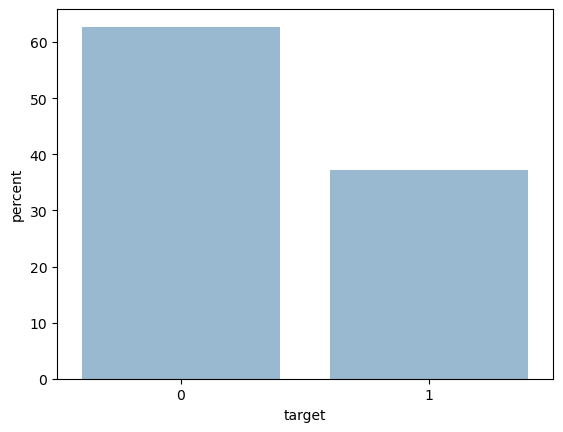

In [6]:
# Looking at the percentatge of patient with Malignant and Bening Tumors
sns.countplot(x='target', data=df_scaled, alpha=0.5, stat="percent")

Aproximaly the 60% of the patients had Benign tumor while the rest of them had Malignant.

A 60/40 proportion for training the model is commonly used and considered appropriate in many machine learning applications. This proportion ensures that the model is trained on a diverse dataset while still providing a sufficient number of samples for each class. As such, it is not necessary to employ resampling techniques such as oversampling or undersampling to balance the classes. By using the 60/40 proportion, we can effectively train the model on representative data and achieve reliable performance without introducing additional complexity or potential biases.

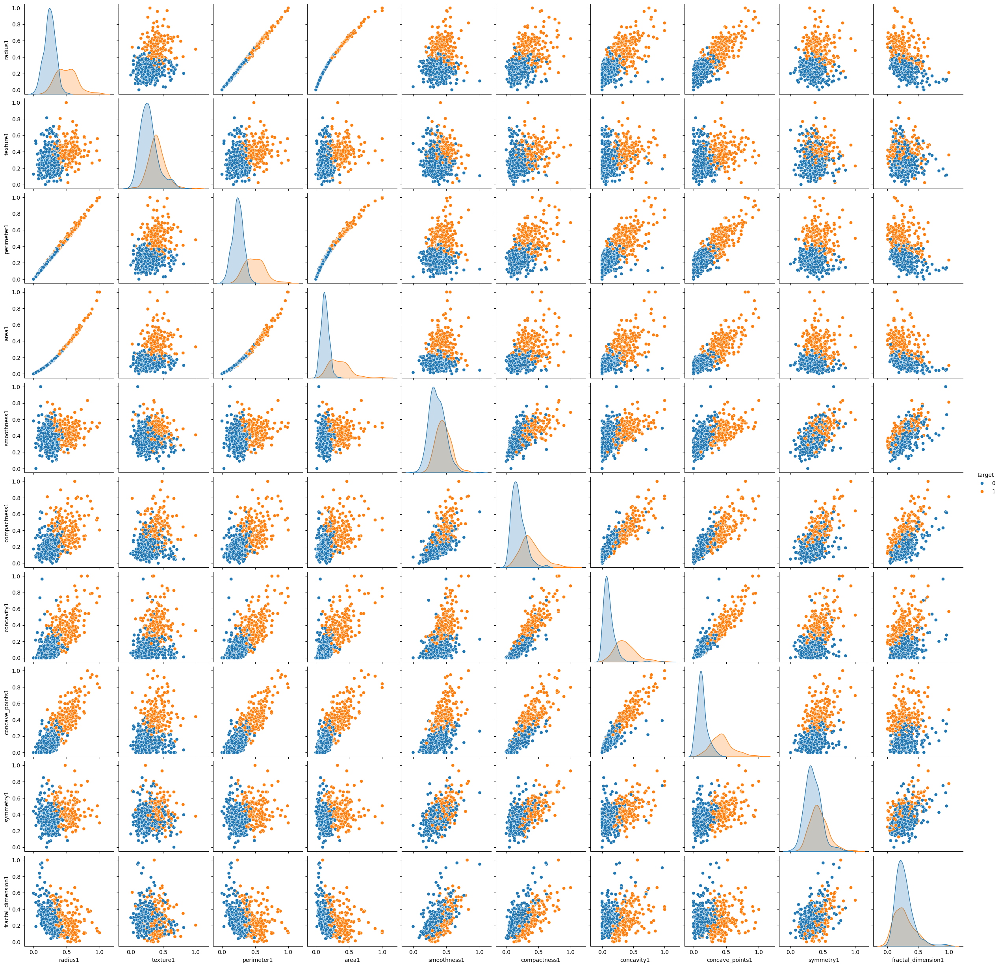

In [7]:
# Scartterplot for the first 10 variables
df_scatterplot = df_scaled.iloc[:, :10]
df_scatterplot['target'] = df_scaled['target']
sns.pairplot(df_scatterplot, hue='target')

It is observed that exists a high correlation between the radius, area and perimeter variables. his correlation is due to the intrinsic nature of these variables, where the area and perimeter are derived from the radius. 

In order to avoid multicollinearity in the model and simplify the interpretation of the results, it have been decided to remove the area and perimeter variables from the dataset. 

In [15]:
# Remove perimeter and area variable

removed_columns = ['perimeter1','perimeter2','perimeter3','area1','area2','area3']

df_scaled = df_scaled.drop(columns=removed_columns)

df_scaled.columns

Index(['radius1', 'texture1', 'smoothness1', 'compactness1', 'concavity1',
       'concave_points1', 'symmetry1', 'fractal_dimension1', 'radius2',
       'texture2', 'smoothness2', 'compactness2', 'concavity2',
       'concave_points2', 'symmetry2', 'fractal_dimension2', 'radius3',
       'texture3', 'smoothness3', 'compactness3', 'concavity3',
       'concave_points3', 'symmetry3', 'fractal_dimension3', 'target'],
      dtype='object')

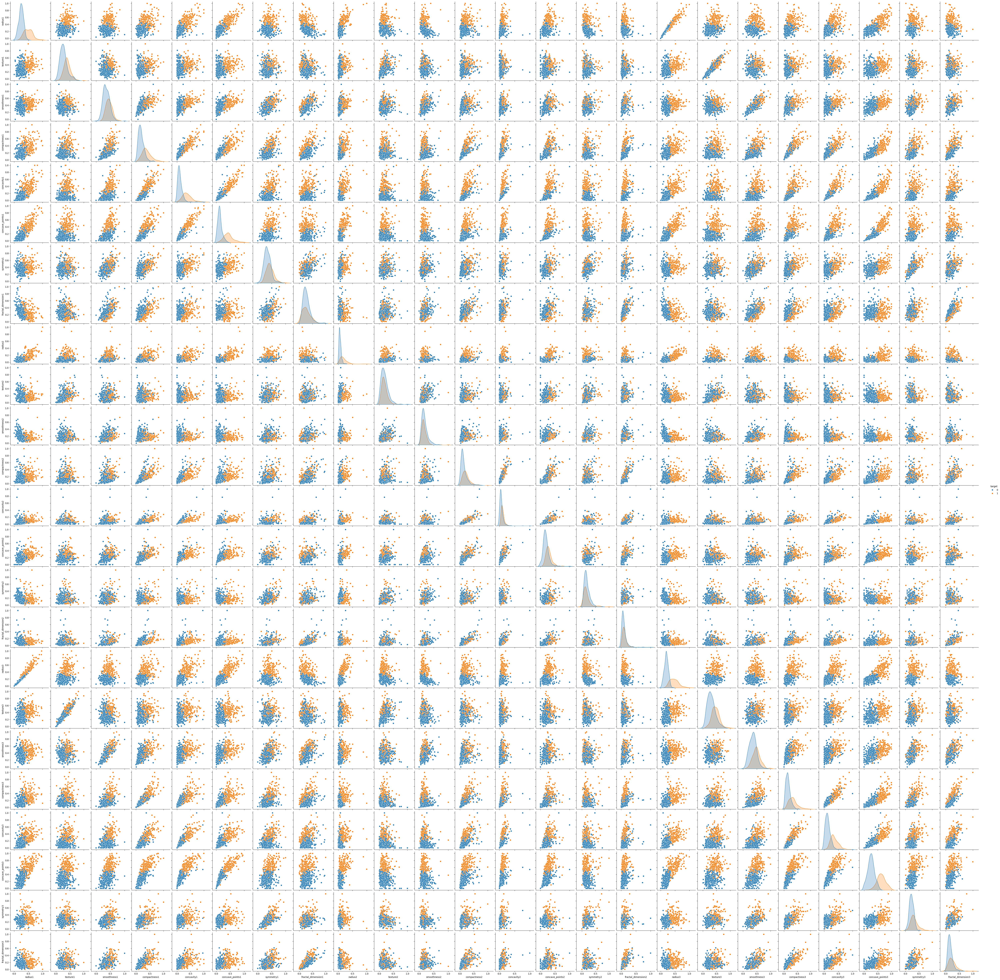

In [17]:
# Scartterplot for the first 10 variables
sns.pairplot(df_scaled, hue='target')

<AxesSubplot:>

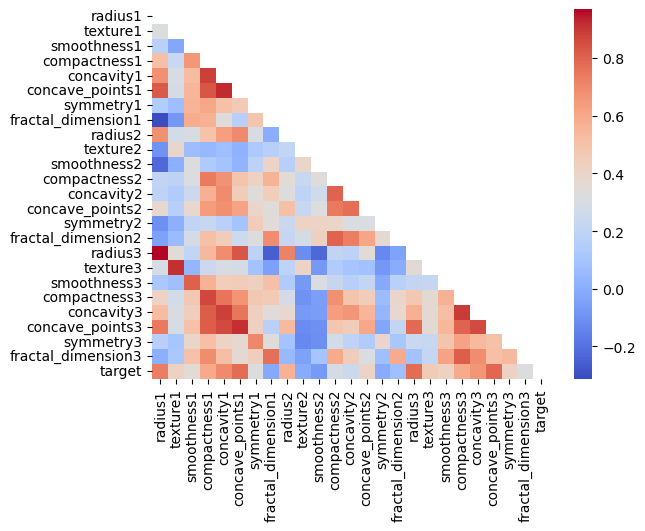

In [22]:
# To se if the features are coorelate

# Calcular la matriz de correlación
correlation_matrix = df_scaled.corr()

# Crear una máscara triangular inferior
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Crear el heatmap con la matriz de correlación y la máscara triangular inferior
sns.heatmap(correlation_matrix, mask=mask, cmap='coolwarm')


### Splitting training and testing sets

In [23]:
# Splitting data for training (80%) and testing (70%)
from sklearn.model_selection import train_test_split

X = df_scaled.drop("target", axis = 1)
y = df_scaled["target"].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 7,
                                shuffle = True)
print(X_train.shape)
print(X_test.shape)

(455, 24)
(114, 24)


In [24]:
# Logistic Regression
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
result = model.fit(X_train, y_train)
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score

prediction_test = model.predict(X_test)

print(f'Recall Score : {recall_score(y_test, prediction_test)}')
print(f'Accuracy Socre : {accuracy_score(y_test, prediction_test)}')
print(f'Precision Score : {precision_score(y_test, prediction_test)}')

Recall Score : 0.85
Accuracy Socre : 0.9473684210526315
Precision Score : 1.0


In [25]:
from sklearn.metrics import classification_report
print(classification_report(y_test, prediction_test, target_names = ["benign", "malignant"]))

              precision    recall  f1-score   support

      benign       0.93      1.00      0.96        74
   malignant       1.00      0.85      0.92        40

    accuracy                           0.95       114
   macro avg       0.96      0.93      0.94       114
weighted avg       0.95      0.95      0.95       114



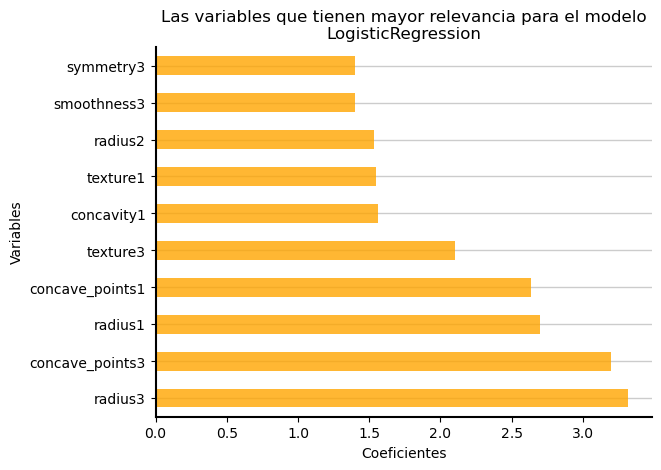

In [28]:
# Variables más importante del modelo
fig, ax = plt.subplots()
weights_lg = pd.Series(model.coef_[0],
                    index=X.columns.values)
weights_lg.sort_values(ascending=False)[:10].plot(kind="barh", color = "orange", alpha = 0.8)
plt.title("Las variables que tienen mayor relevancia para el modelo\nLogisticRegression")
plt.xlabel("Coeficientes")
plt.ylabel("Variables")
for i in ['bottom', 'left']:
    ax.spines[i].set_color('black')
    ax.spines[i].set_linewidth(1.5) 
right_side = ax.spines["right"]
right_side.set_visible(False)
top_side = ax.spines["top"]
top_side.set_visible(False)
ax.set_axisbelow(True)
ax.grid(color='gray', linewidth=1, axis='y', alpha=0.4)
plt.show()

/tmp/ipykernel_15810/2842706306.py:8: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


<Figure size 600x400 with 0 Axes>

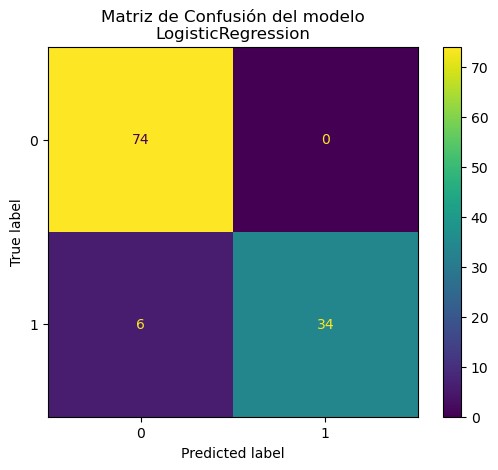

In [29]:
# Matriz de Confusión del modelo
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
fig = plt.figure(figsize=(6,4))
cm = confusion_matrix(y_test, prediction_test, labels=model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot(cmap="viridis")
plt.title("Matriz de Confusión del modelo\nLogisticRegression")
fig.show()

Max. depth: 1.000, train: 0.923, test: 0.921
Max. depth: 2.000, train: 0.963, test: 0.930
Max. depth: 3.000, train: 0.969, test: 0.939
Max. depth: 4.000, train: 0.987, test: 0.965
Max. depth: 5.000, train: 0.991, test: 0.982
Max. depth: 6.000, train: 0.996, test: 0.965
Max. depth: 7.000, train: 0.998, test: 0.991
Max. depth: 8.000, train: 1.000, test: 0.974
Max. depth: 9.000, train: 1.000, test: 0.982
Max. depth: 10.000, train: 1.000, test: 0.974
Max. depth: 11.000, train: 1.000, test: 0.974
Max. depth: 12.000, train: 1.000, test: 0.974
Max. depth: 13.000, train: 1.000, test: 0.947
Max. depth: 14.000, train: 1.000, test: 0.956
Max. depth: 15.000, train: 1.000, test: 0.956
Max. depth: 16.000, train: 1.000, test: 0.965
Max. depth: 17.000, train: 1.000, test: 0.974
Max. depth: 18.000, train: 1.000, test: 0.965
Max. depth: 19.000, train: 1.000, test: 0.956
Max. depth: 20.000, train: 1.000, test: 0.974
Max. depth: 21.000, train: 1.000, test: 0.974
Max. depth: 22.000, train: 1.000, test: 0.9

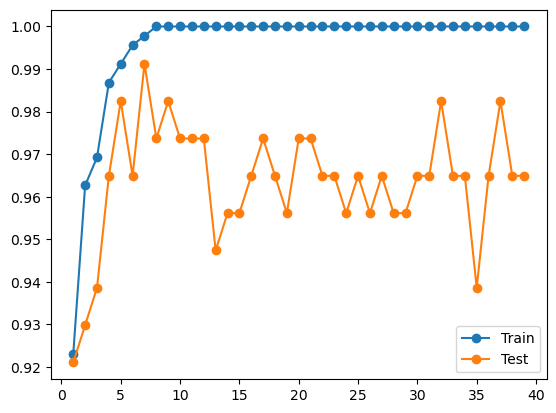

In [30]:
# TreeClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

train_scores, test_scores = list(), list()
max_depths = [i for i in range(1,40)]
for i in max_depths:
    dtc = DecisionTreeClassifier(max_depth=i)
    dtc = dtc.fit(X_train, y_train)
    train_yhat = dtc.predict(X_train)
    train_acc = accuracy_score(y_train, train_yhat)
    train_scores.append(train_acc)
    test_yhat = dtc.predict(X_test)
    test_acc = accuracy_score(y_test, test_yhat)
    test_scores.append(test_acc)
    print('Max. depth: %.3f, train: %.3f, test: %.3f' % (i, train_acc, test_acc))

plt.plot(max_depths, train_scores, '-o', label='Train')
plt.plot(max_depths, test_scores, '-o', label='Test')
plt.legend()
plt.show()

In [31]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score

prediction_test_dtc = dtc.predict(X_test)
print(f'Recall Score : {recall_score(y_test, prediction_test_dtc)}')
print(f'Accuracy Socre : {accuracy_score(y_test, prediction_test_dtc)}')
print(f'Precision Score : {precision_score(y_test, prediction_test_dtc)}')

Recall Score : 0.95
Accuracy Socre : 0.9649122807017544
Precision Score : 0.95


In [32]:
# Random Forest Model
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score

# Initiating the model:
rf = RandomForestClassifier()

scores = cross_val_score(rf, X_train, y_train, scoring='accuracy' ,cv=10).mean()

print("The mean accuracy with 10 fold cross validation is %s" % round(scores*100,2))

The mean accuracy with 10 fold cross validation is 95.83
